<a href="https://colab.research.google.com/github/neclipse/Metal_defects_detection/blob/Hao-training-practice/testing%20using%20updated%20dataset2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# install dependencies: 
!pip install pyyaml==5.1 pycocotools>=2.0.1
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
!gcc --version
# opencv is pre-installed on colab

1.7.0+cu101 True
gcc (Ubuntu 7.5.0-3ubuntu1~18.04) 7.5.0
Copyright (C) 2017 Free Software Foundation, Inc.
This is free software; see the source for copying conditions.  There is NO
warranty; not even for MERCHANTABILITY or FITNESS FOR A PARTICULAR PURPOSE.



In [2]:
# install detectron2: (Colab has CUDA 10.1 + torch 1.6)
# torch version updaed to 1.7.0; 11/24/2020
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
assert torch.__version__.startswith("1.7.0")
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html

Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu101/torch1.6/index.html
     |████████████████████████████████| 6.6MB 625kB/s 
     |████████████████████████████████| 2.2MB 15.5MB/s 
  Created wheel for fvcore: filename=fvcore-0.1.2.post20201213-cp36-none-any.whl size=40711 sha256=ddf159f93d2e8536601cf0337c62d03280e08a17c334d22f5822832714e9dd40
  Stored in directory: /root/.cache/pip/wheels/20/eb/f9/b537cf42e3b4c57fe2a49aecad264c775df2d89e0ffbf5b17d
  Created wheel for iopath: filename=iopath-0.1.2-cp36-none-any.whl size=10505 sha256=49bcf55f5294a84a3a9c6c9085a0224aec2c3157996f488afef3fdc0474c1223
  Stored in directory: /root/.cache/pip/wheels/9e/01/e4/1b68f5a2a6b9450ea4246d91840a77e1169f7d4722d76bbc47
Successfully built fvcore iopath
ERROR: albumentations 0.1.12 has requirement imgaug<0.2.7,>=0.2.5, but you'll have imgaug 0.2.9 which is incompatible.
  Found existing installation: Pillow 7.0.0
    Uninstalling Pillow-7.0.0:
      Successfully uninstalled Pillow-7.

In [1]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 

** fvcore version of PathManager will be deprecated soon. **
** Please migrate to the version in iopath repo. **
https://github.com/facebookresearch/iopath 



In [2]:
!wget https://raw.github.com/neclipse/Metal_defects_detection/Hao-training-practice/training_dataset2.zip
!unzip training_dataset2.zip > /dev/null

--2020-12-14 20:51:12--  https://raw.github.com/neclipse/Metal_defects_detection/Hao-training-practice/training_dataset2.zip
Resolving raw.github.com (raw.github.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.github.com (raw.github.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://raw.githubusercontent.com/neclipse/Metal_defects_detection/Hao-training-practice/training_dataset2.zip [following]
--2020-12-14 20:51:12--  https://raw.githubusercontent.com/neclipse/Metal_defects_detection/Hao-training-practice/training_dataset2.zip
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 151.101.0.133, 151.101.64.133, 151.101.128.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|151.101.0.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 15006228 (14M) [application/zip]
Saving to: ‘training_dataset2.zip’

training_dataset2.z 100%

In [3]:
!pip install labelme2coco

In [4]:
# import package
import labelme2coco
labelme2coco.convert("training_dataset2/train", "training_dataset2/train/annotation_train.json")
labelme2coco.convert("training_dataset2/validate", "training_dataset2/validate/annotation_validate.json")

In [5]:
from detectron2.data.datasets import register_coco_instances
# args: name(str), metadata (dict): default empty, json_file_path (str), image_root (str or path like): root directory for images  
register_coco_instances("my_dataset_t", {}, "training_dataset2/train/annotation_train.json", "")
register_coco_instances("my_dataset_v", {}, "training_dataset2/validate/annotation_validate.json", "")

[12/14 20:51:29 d2.data.datasets.coco]: Loaded 9 images in COCO format from training_dataset2/train/annotation_train.json
training_dataset2/train/800_013 cropped.png


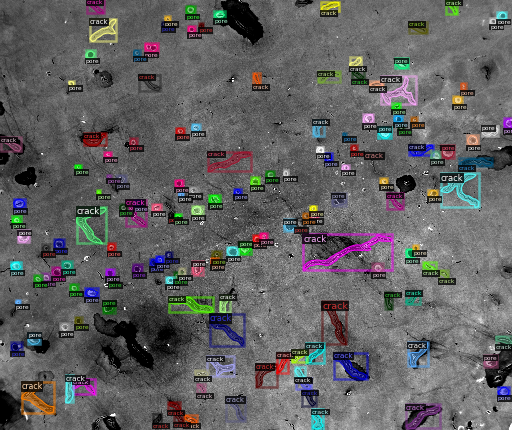

training_dataset2/train/1100_018 cropped.png


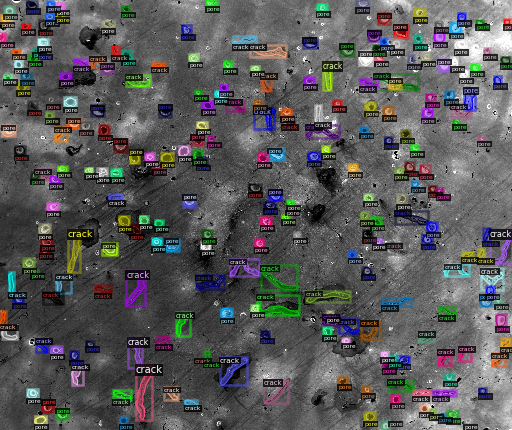

training_dataset2/train/800_022 cropped.png


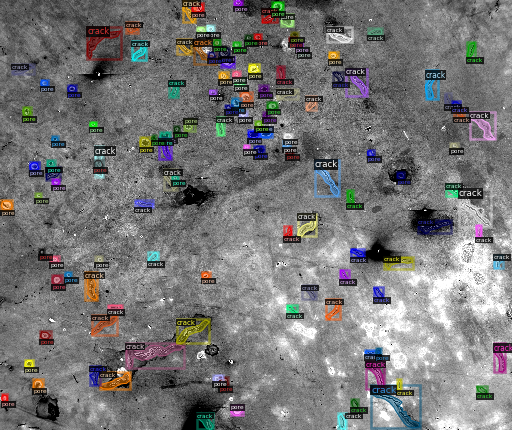

In [6]:
dataset_dict=DatasetCatalog.get("my_dataset_t")
mymetadata=MetadataCatalog.get("my_dataset_t")
#dataset_dicts = get_balloon_dicts("balloon/train")
for d in random.sample(dataset_dict, 3):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=mymetadata, scale=0.5)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

In [15]:
from detectron2.engine import DefaultTrainer

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_t",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")  # Let training initialize from model zoo
cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025  # pick a good LR
cfg.SOLVER.MAX_ITER = 5000   # 300 iterations seems good enough for this toy dataset; you will need to train longer for a practical dataset
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512   # faster, and good enough for this toy dataset (default: 512)
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2  # two classes(crack and pore)

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
trainer = DefaultTrainer(cfg) 
trainer.resume_or_load(resume=False)
trainer.train()

[12/14 21:08:00 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to incompatible shapes: (80, 256, 1, 1) in the checkpoint but (2, 256, 1, 1) in

[12/14 21:08:01 d2.engine.train_loop]: Starting training from iteration 0
[12/14 21:08:12 d2.utils.events]:  eta: 0:45:54  iter: 19  total_loss: 5.786  loss_cls: 1.162  loss_box_reg: 0.4908  loss_mask: 0.693  loss_rpn_cls: 3.156  loss_rpn_loc: 0.3341  time: 0.5647  data_time: 0.0208  lr: 4.9953e-06  max_mem: 3398M
[12/14 21:08:24 d2.utils.events]:  eta: 0:47:07  iter: 39  total_loss: 3.207  loss_cls: 1.101  loss_box_reg: 0.5327  loss_mask: 0.6872  loss_rpn_cls: 0.6775  loss_rpn_loc: 0.2964  time: 0.5692  data_time: 0.0062  lr: 9.9902e-06  max_mem: 3398M
[12/14 21:08:36 d2.utils.events]:  eta: 0:47:19  iter: 59  total_loss: 2.735  loss_cls: 1.015  loss_box_reg: 0.5724  loss_mask: 0.6757  loss_rpn_cls: 0.2035  loss_rpn_loc: 0.2774  time: 0.5767  data_time: 0.0060  lr: 1.4985e-05  max_mem: 3398M
[12/14 21:08:48 d2.utils.events]:  eta: 0:47:45  iter: 79  total_loss: 2.553  loss_cls: 0.884  loss_box_reg: 0.4898  loss_mask: 0.6598  loss_rpn_cls: 0.2151  loss_rpn_loc: 0.2759  time: 0.5857  da

In [16]:
# Look at training curves in tensorboard:
%load_ext tensorboard
%tensorboard --logdir output

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 327), started 1:01:19 ago. (Use '!kill 327' to kill it.)

<IPython.core.display.Javascript object>

In [17]:
# cfg already contains everything we've set previously. Now we changed it a little bit for inference:
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")  # path to the model we just trained
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set a custom testing threshold
predictor = DefaultPredictor(cfg)

[12/14 22:05:52 d2.data.datasets.coco]: Loaded 2 images in COCO format from training_dataset2/validate/annotation_validate.json
training_dataset2/validate/1100_029 cropped.png


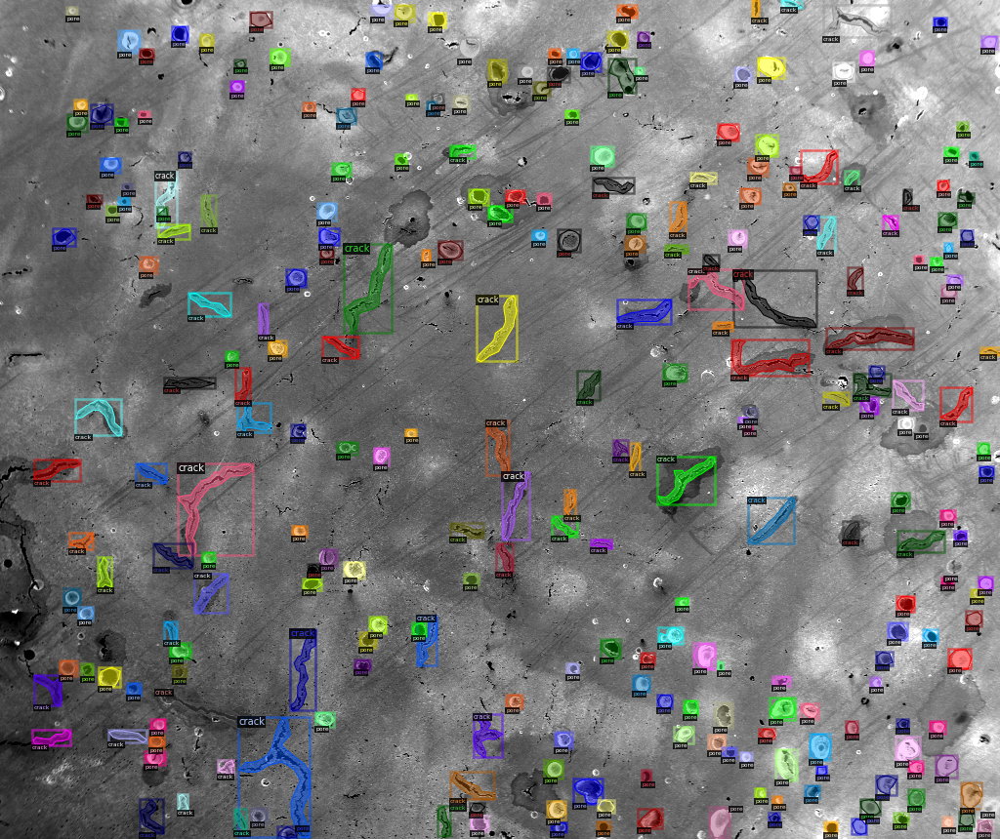

training_dataset2/validate/1100_028 cropped.png


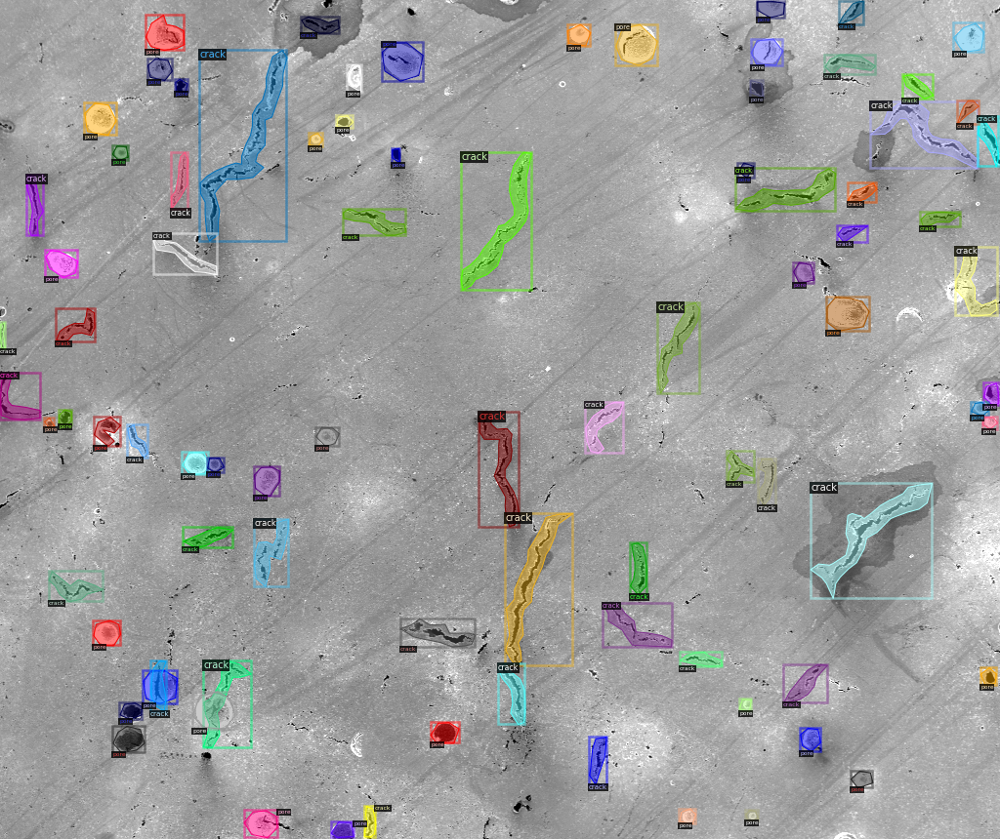

In [18]:
dataset_dict2=DatasetCatalog.get("my_dataset_v")
mymetadata2=MetadataCatalog.get("my_dataset_v")
#dataset_dicts = get_balloon_dicts("balloon/train")
for d in random.sample(dataset_dict2, 2):
    print(d["file_name"])
    img = cv2.imread(d["file_name"])
    visualizer = Visualizer(img[:, :, ::-1], metadata=mymetadata2, scale=1)
    out = visualizer.draw_dataset_dict(d)
    cv2_imshow(out.get_image()[:, :, ::-1])

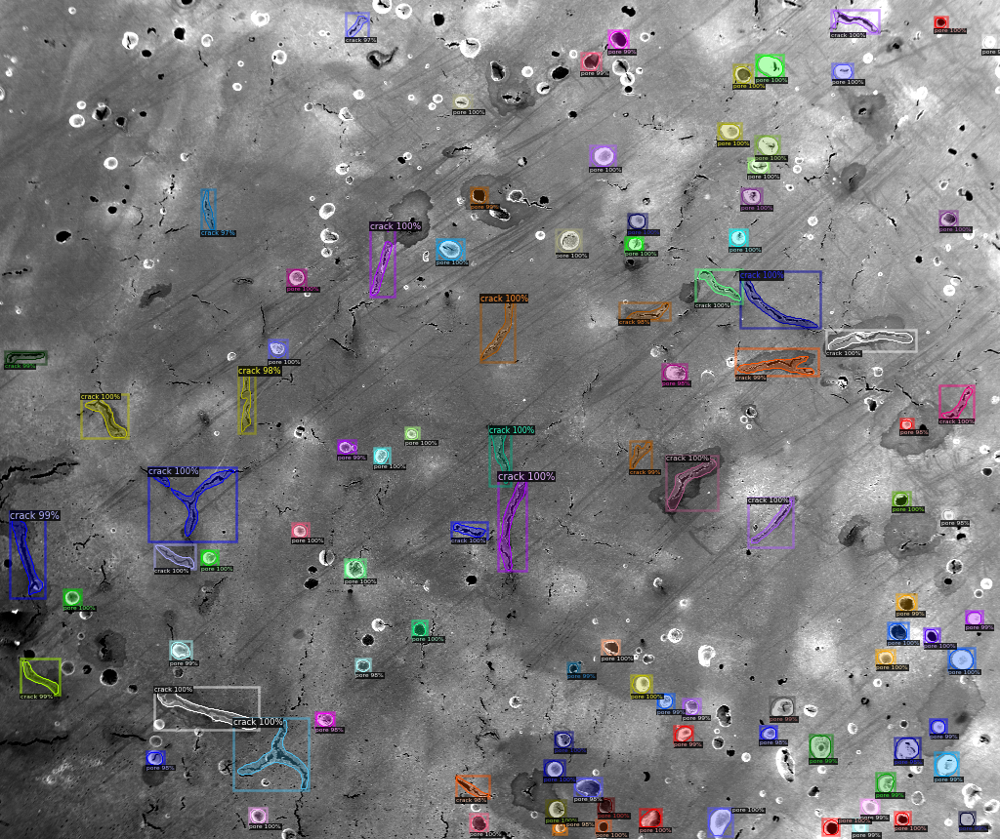

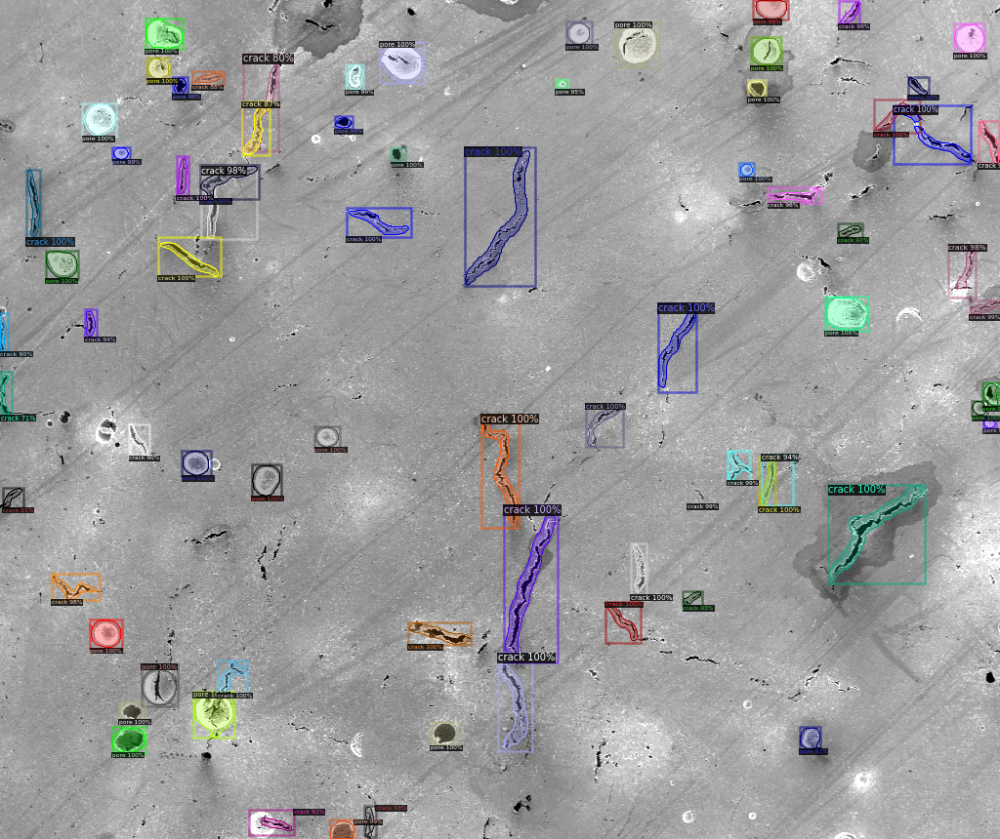

In [19]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = dataset_dict2
for d in random.sample(dataset_dicts, 2):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)  # format is documented at https://detectron2.readthedocs.io/tutorials/models.html#model-output-format
    v = Visualizer(im[:, :, ::-1],
                   metadata=mymetadata2, 
                   scale=1, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels. This option is only available for segmentation models
    )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    cv2_imshow(out.get_image()[:, :, ::-1])

In [20]:
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader
evaluator = COCOEvaluator("my_dataset_v", ("bbox", "segm"), False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_v")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

[12/14 22:06:22 d2.data.datasets.coco]: Loaded 2 images in COCO format from training_dataset2/validate/annotation_validate.json
[12/14 22:06:22 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[12/14 22:06:22 d2.data.common]: Serializing 2 elements to byte tensors and concatenating them all ...
[12/14 22:06:22 d2.data.common]: Serialized dataset takes 0.08 MiB
[12/14 22:06:22 d2.evaluation.evaluator]: Start inference on 2 images
[12/14 22:06:23 d2.evaluation.evaluator]: Total inference time: 0:00:00.391437 (0.391437 s / img per device, on 1 devices)
[12/14 22:06:23 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:00 (0.131739 s / img per device, on 1 devices)
[12/14 22:06:23 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[12/14 22:06:23 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[12/14 22:06